<a href="https://colab.research.google.com/github/predicthq/phq-data-science-docs/blob/master/live-tv-events/part_2_data_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Live TV Events Data Science Guides

# Part 2: Data Exploration

<b>A How To Guide to exploring PredictHQ Live TV events data.</b>

- [Setup](#setup)
- [SDK or CSV Data Access](#csv_sdk)
- [City Examples](#city_examples)
- [Total Viewing Time](#total_viewing_time)
- [Top Five Games](#top_5_games)
- [Broadcast Distribution](#broadcast_distribution)
- [Viewership Distribution](#viewership_distribution)
- [Broadcast Duration](#broadcast_duration)
- [Time of Viewing](#time_of_viewing)
- [Live TV Events Data as Timeseries](#timeseries)
- [Visualize Live TV Events Viewership Spacially  - Super Bowl](#spacial)
- [One Team](#one_team)
- [Forecasting Impact](#forecasting_impact)

<a id='setup'></a>
## Setup

If using Google Colab uncomment the following code block.

In [2]:
# %%capture
# !git clone https://github.com/predicthq/phq-data-science-docs.git
# %cd phq-data-science-docs/live-tv-events
# !pip install predicthq

If running locally, set up a Python environment using ```requirements.txt``` shared alongside the notebook to install the required dependancies.

In [2]:
import pandas as pd
import numpy as np
from datetime import timedelta
from datetime import datetime
import json
import math

import pytz

from predicthq import Client

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

import folium
from folium.plugins import Search

import branca.colormap as cmp

<a id='csv_sdk'></a>
## SDK or CSV Data Access
This notebook can be run using both the csv example data provided, or if you have access to the PredictHQ Broadcast Endpoint, you can use the code provided to call the SDK for the locations of interest to you. 

The starting point for Part 2 is the dataset created at the end of Part 1. As using the SDK is not the focus of Part 2, a function is created to call the SDK. For guidance on how to use the SDK refer to Part 1. 

The function used to query the SDK uses the place_id of the county as a parameter. The function could be easily adjusted to use the latitude and longitude of a location.

The following csv files need to be available in ```data/tv_events_data/``` if running without access to the SDK.

- 4696376_county_raw.csv
- 4888671_county_raw.csv
- 5368381_county_raw.csv
- 5501879_county_raw.csv

In [31]:
# Set whether to run with SDK or using provided CSV files
# Set to either 'CSV' or 'SDK'
RUN_SETTING = 'CSV'

# If using RUN_SETTING = 'CSV' update CURRENT_PLACENAME and CURRENT_PLACEID
# If using RUN_SETTING = 'SDK' update ACCESS_TOKEN, CURRENT_PLACENAME, CURRENT_PLACEID, START and END

# Replace Access Token with own access token.
ACCESS_TOKEN = passwords.ACCESS_TOKEN
phq = Client(access_token=ACCESS_TOKEN)

CURRENT_PLACENAME = 'Cook County Chicago'
CURRENT_PLACEID = 4888671
START_DATE = '2019-01-01'
END_DATE = '2021-02-14'

In [32]:
def _extract_matching_label(event_labels, labels_to_match):
    '''For each broadcast the league and sport type need to be
    extracted. These labels are extracted from the labels.
    As the order of the labels varies this look up is
    required to compare to the frozenset of options.
    '''
    for label in labels_to_match:
        if label in event_labels:
            return label
    return None


SPORTS = frozenset([
        'american-football',
        'baseball',
        'basketball',
        'ice-hockey',
        'soccer',
    ])
LEAGUES = frozenset([
        'mlb',
        'mls',
        'nba',
        'ncaa',
        'nfl',
        'nhl',
    ])

def convert_timezone(row):
    '''Convert event predicted end time to 
    broadcast location timezone from the event timezone.
    '''
    event_end_naive = row['dates_event']['predicted_end_local']
    event_timezone = pytz.timezone(row['dates_event']['timezone'])

    event_end_localtime= event_timezone.localize(event_end_naive, is_dst=None)
    event_end_utc = event_end_localtime.astimezone(pytz.utc)

    broadcast_timezone = row['dates_broadcast']['timezone']
    broadcast_end_localtime = event_end_utc.astimezone(pytz.timezone(broadcast_timezone))
    row['predicted_end_time_broadcast_local'] = broadcast_end_localtime.replace(tzinfo=None)

    return row


# This function uses the place_id. It could be changed
# to use lat and long with place_id replaced with location__origin
# for example: location__origin='34.05223,-118.24368'
def query_location(place_id, start, end):
    '''Query SDK for broadcast data for one county between
    start and end.
    '''

    search_results = phq.broadcasts.search(phq_viewership__gte=100,
                                           start={'gte': START_DATE,
                                                  'lte': END_DATE},
                                           location__place_id=place_id,
                                           #start__tz=,
                                           limit=500,
                                          ).iter_all()

    search_results = [result.to_dict() for result in search_results]

    df = pd.DataFrame(search_results)

    # Extract out additional information
    # 'event' stores the additional data about the physical event
    df = df.merge(df['event'].apply(pd.Series),
                  left_index=True,
                  right_index=True,
                  suffixes=('_broadcast', '_event'))

    # Extract sport and league from the labels in the nested event data.
    df['sport'] = df.labels.apply(_extract_matching_label, args=(SPORTS,))
    df['league'] = df.labels.apply(_extract_matching_label, args=(LEAGUES,))

    df['local_start_date'] = (df.dates_broadcast
                                .apply(
                                        lambda start_dt:
                                        (start_dt['start_local']).date()
                                       )
                              )

    df['county_place_id'] = (df.location_broadcast
                               .apply(
                                       lambda location:
                                       location['places'][0]['place_id']
                                     )
                             )

    df['local_start_datetime'] = (df.dates_broadcast
                                    .apply(
                                            lambda start_dt:
                                            (start_dt['start_local'])
                                          )
                                  )

    # Check for any events without a predicted end time.
    # All broadcasts are expected to have a predicted end time
    broadcast_id_no_endtime = [row['broadcast_id'] for _, row in df.iterrows() \
                               if not row.get('dates_event', {}).get('predicted_end_local')]
    # Remove any broadcasts without a predicted end time.
    df = df[~df['broadcast_id'].isin(broadcast_id_no_endtime)]

    # Convert the predicted end time of the event to broadcast timezone.
    df = df.apply(convert_timezone, axis=1)

    df['sport_league'] = df['sport'] + '_' + df['league']
    # Calculate the duration of the broadcast. 
    df['duration'] = df['predicted_end_time_broadcast_local'] - df['local_start_datetime']
    df['duration_hours'] = df['duration'].dt.seconds/(60*60)
    df['total_viewing'] = df['duration_hours'] * df['phq_viewership']

    return df

<a id='city_examples'></a>
## City Examples 

To understand the value of Live TV Events Data we can look at individual cities. You can use the Appendix of Part 1 to find the county place_id for the place of interest to you. Alternatively use one of the following examples: 

 - 'Clark County, Las Vagas, Nevada' : 5501879

 - 'Los Angeles County, California': 5368381

 - 'Cook County, Chicago, Illinois': 4888671

 - 'Harris County, Houston, Texas': 4696376

In [33]:
# Executes either the function to call the SDK or loads in the data from CSV.

if RUN_SETTING == 'SDK':
    df = query_location(place_id=CURRENT_PLACEID, start=START_DATE, end=END_DATE)
    
elif RUN_SETTING == 'CSV':
    df = pd.read_csv('data/tv_events_data/{}_county_raw.csv'.format(CURRENT_PLACEID))
    START_DATE = '2019-01-01'
    END_DATE = '2021-02-14'
    # Format local_start_datetime to datetime
    df['local_start_datetime'] = pd.to_datetime(df['local_start_datetime'])
else:
    print("Must set RUN_SETTING to either 'SDK' or 'CSV'")

df['county_name'] = CURRENT_PLACENAME

<a id='total_viewing_time'></a>
## Total Viewing Time

In [34]:
# Total viewership hours in millions
total_viewing_hours = int(df['total_viewing'].sum() / 1000000)
print('\033[1m For {}, between {} and {},there were {} million hours of sports viewing!'
      .format(CURRENT_PLACENAME,
              START_DATE,
              END_DATE,
              total_viewing_hours
              )
      )
print('\033[1m Understanding the trends in these {} million viewing hours can provide significant opportunity.'
      .format(total_viewing_hours))

 For Los Angeles County, California, between 2019-01-01 and 2021-02-14,there were 1559 million hours of sports viewing!
 Understanding the trends in these 1559 million viewing hours can provide significant opportunity.


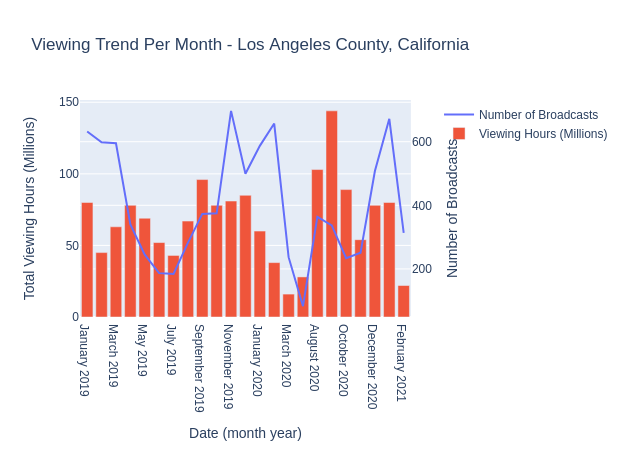

In [35]:
# Screen time by month
df['month'] = df['local_start_datetime'].dt.month_name()
df['month_num'] = df['local_start_datetime'].dt.month
df['year'] = df['local_start_datetime'].dt.year
df_monthly = df.groupby(['month','year'], as_index=False)\
               .agg({'total_viewing': 'sum',
                     'broadcast_id':'count',
                     'month_num': 'max',
                     'year':'max'}).sort_values('month_num')

df_monthly['year_month'] = df_monthly['month'].astype(str) + ' ' + df_monthly['year'].astype(str)

df_monthly['total_viewing_millions'] = (df_monthly['total_viewing']
                                             / 1000000).astype(int)
df_monthly.sort_values(['year', 'month_num'], inplace=True)

# Use plotly to visualize results 
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
                x=df_monthly['year_month'],
                y=df_monthly['broadcast_id'],
                name='Number of Broadcasts'
              ),
                secondary_y=True)

fig.add_trace(
    go.Bar(
           x=df_monthly['year_month'],
           y=df_monthly['total_viewing_millions'],
           name='Viewing Hours (Millions)'
          )
            )

fig.update_layout(
    title_text="Viewing Trend Per Month - {}".format(CURRENT_PLACENAME)
)

fig.update_xaxes(title_text="Date (month year)")
fig.update_yaxes(title_text="Total Viewing Hours (Millions)", secondary_y=False)
fig.update_yaxes(title_text="Number of Broadcasts", secondary_y=True)

fig.show()

Due to sports being played across seasons there's a variation in viewers over the year. The US winter months see the majority of the larger viewerships.

Note: Depending on your start and end dates the months at the start or end of this analysis may not have a full months worth of data.

<a id='top_5_games'></a>
## Top Five games

In [36]:
pd.set_option('display.max_colwidth', None)
columns = ['county_name', 'title', 'league', 'sport', 'local_start_date', 'phq_viewership']
df.sort_values('phq_viewership', ascending=False).head()[columns]

,county_name,title,league,sport,local_start_date,phq_viewership
703,"Los Angeles County, California",Super Bowl - New England Patriots vs Los Angeles Rams,nfl,american-football,2019-02-03,3456508
5658,"Los Angeles County, California",Super Bowl - 49ers vs Kansas City Chiefs,nfl,american-football,2020-02-02,3020646
9084,"Los Angeles County, California",Super Bowl - Kansas City Chiefs vs Tampa Bay Buccaneers,nfl,american-football,2021-02-07,2638070
425,"Los Angeles County, California",Los Angeles Rams vs New Orleans Saints,nfl,american-football,2019-01-20,1555176
430,"Los Angeles County, California",New England Patriots vs Kansas City Chiefs,nfl,american-football,2019-01-20,1455030


Looking at the top five games, depending on the city you chose you'll likely see some of the following trends:

   - High viewership for important end of season games
   - Highest viewership for NFL
   - High viewership for local teams

<a id='broadcast_distribution'></a>
## Broadcast Distribution By League

In [37]:
df_count = df[['sport_league', 'broadcast_id', 'total_viewing']].groupby('sport_league',
                                                        as_index=False).agg({'broadcast_id':'count',
                                                                             'total_viewing': 'sum'})

df_count['total_viewing_millions'] = (df_count['total_viewing']
                                             / 1000000).astype(int)

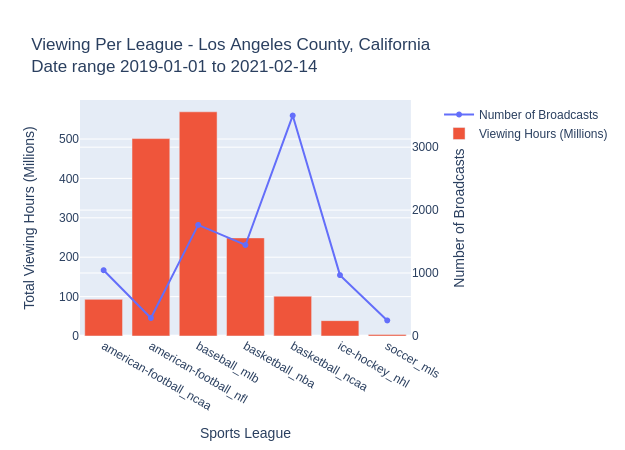

In [38]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
               x=df_count['sport_league'],
               y=df_count['broadcast_id'],
               name='Number of Broadcasts'
              ),
                secondary_y=True)

fig.add_trace(
    go.Bar(                
           x=df_count['sport_league'],
           y=df_count['total_viewing_millions'],
           name='Viewing Hours (Millions)'
          )
            )
fig.update_layout(
    title_text="Viewing Per League - {} <br>Date range {} to {}". \
                format(CURRENT_PLACENAME, START_DATE, END_DATE)
)
fig.update_xaxes(title_text="Sports League")
fig.update_yaxes(title_text="Total Viewing Hours (Millions)", secondary_y=False)
fig.update_yaxes(title_text="Number of Broadcasts", secondary_y=True)


fig.show()

- Different sports leagues have different number of broadcasts per year.
- NCAA, basketball and baseball have the highest number of broadcasts.
- Although NFL has relatively few broadcasts, it has a large number of total viewing hours.

<a id='viewership_distribution'></a>
## Viewership Distribution By League

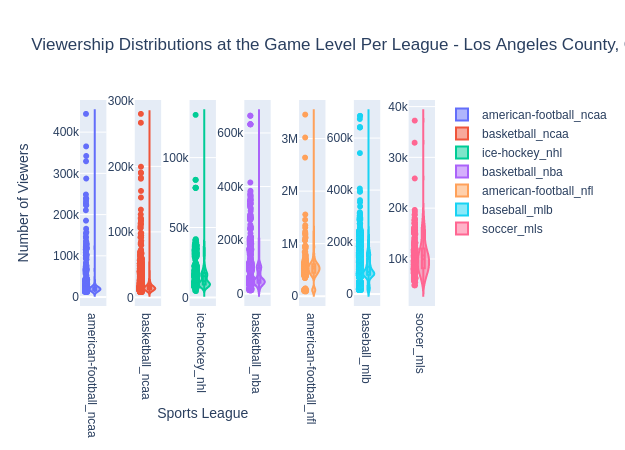

In [39]:
col = 1
sport_leagues = df['sport_league'].unique()

fig = make_subplots(rows=1,
                    cols=len(sport_leagues),
                    start_cell="top-left",
                    horizontal_spacing=0.08)

# Plot each sports league on separate axis. 
for sport in sport_leagues:
    
    fig.add_trace(go.Violin(x=df['sport_league'][df['sport_league'] == sport],
                            y=df['phq_viewership'][df['sport_league'] == sport],
                            name=sport,
                            box_visible=True,
                            meanline_visible=True),
                            row = 1,
                            col = col,
                           )
    fig.update_xaxes(tickangle=90, row=1, col=col)
    col = col+1
    
fig.update_traces(meanline_visible=True,
                  points='all',
                  jitter=0.2,
                  scalemode='count')

fig.update_layout(
    title_text="Viewership Distributions at the Game Level Per League - {} (different y axis)". \
                format(CURRENT_PLACENAME)
)

fig.update_xaxes(title_text="Sports League", row=1, col=int(len(sport_leagues)/2))
fig.update_yaxes(title_text="Number of Viewers", row=1, col=1)
fig.show()

- Outlier NFL games (Super Bowl) have significantly higher viewership than any other broadcasts.
- MLS broadcasts have the smallest viewership numbers and the smallest variation.
- All distributions show a long tail of high viewership events. Particularly for NCAA broadcasts, the majority of broadcasts have very low viewership with a large spread of broadcasts in the 4th quartile.  
- Understanding the large viewership outliers will be important. 
- A large number of small viewership events may contribute noise and could be removed in aggregation.

<a id='broadcast_duration'></a>
## Broadcast Duration

In [40]:
df_duration = df[['sport_league', 'duration_hours']].groupby('sport_league',
                                                        as_index=False).mean()

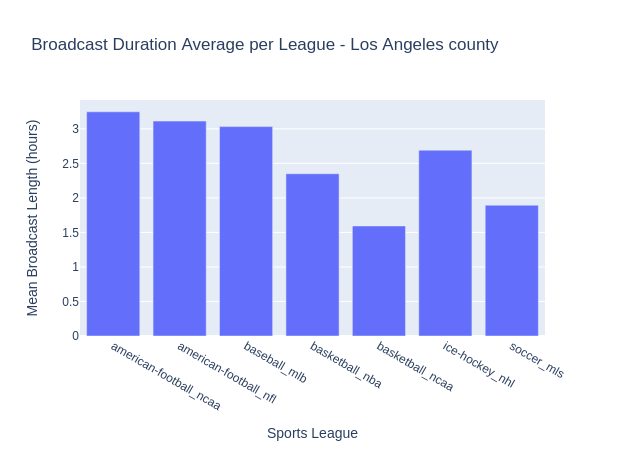

In [41]:
fig = px.bar(df_duration,
             x='sport_league',
             y='duration_hours',
             labels=dict(duration_hours="Mean Broadcast Length (hours)",
                         sport_league='Sports League'),
            title='Broadcast Duration Average per League - {} county'.format('Los Angeles'))
fig.show()

Basketball NCAA and Soccer MLS mean duration are nearly half that of American Football games. 
Longer games may result in viewers being more likely to order food and drink. The longer duration makes the total viewership hours higher and this might result in longer sports having a larger economic impact. 

With longer events, demand may be effected over a longer time period. When considering the impact on demand, the start time, whole duration or end of an event may all be relevant. Considering the event duration is likely to be more important when considering demand at a more granular hourly level as opposed to daily. 

<a id='time_of_viewing'></a>
## Time of Viewing

In [42]:
def bucket_viewing_times(row):
    ''' Split broadcasts into interpretable parts of the day.
    Example breakdown used:
    morning 6-11
    lunch 11-14
    afternoon 14-17
    evening 17-22
    overnight 22-6
    '''
    start_hour = row['local_start_datetime'].hour
    if (start_hour >= 6 and start_hour < 11):
        row['time_type'] = 'morning'
    if (start_hour >= 11 and start_hour < 14):
        row['time_type'] = 'lunch'
    if (start_hour >= 14 and start_hour < 17):
        row['time_type'] = 'afternoon'
    if (start_hour >= 17 and start_hour < 22):
        row['time_type'] = 'evening'
    if (start_hour >= 22 or start_hour < 6):
        row['time_type'] = 'overnight'
    return row

In [43]:
df = df.apply(bucket_viewing_times, axis=1)

df_day_time = df.groupby('time_type').agg(
                            {'phq_viewership': 'sum',
                             'broadcast_id':'count', 
                             'time_type': max})

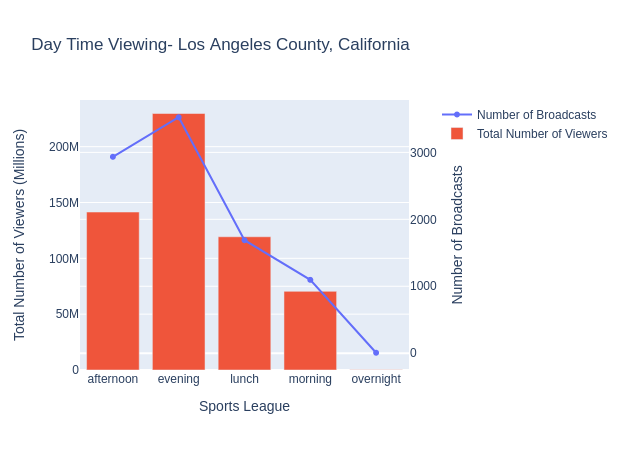

In [44]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
               x=df_day_time['time_type'],
               y=df_day_time['broadcast_id'],
               name='Number of Broadcasts'
              ),
                secondary_y=True)

fig.add_trace(
    go.Bar(                
           x=df_day_time['time_type'],
           y=df_day_time['phq_viewership'],
           name='Total Number of Viewers'
          )
            )
# Add figure title
fig.update_layout(
    title_text="Day Time Viewing- {}".format(CURRENT_PLACENAME)
)

# Set x-axis title
fig.update_xaxes(title_text="Sports League")

# Set y-axes titles
fig.update_yaxes(title_text="Total Number of Viewers (Millions)", secondary_y=False)
fig.update_yaxes(title_text="Number of Broadcasts", secondary_y=True)

fig.show()

The time distribution of when people are watching sports events will likely have a large impact on behaviour. By considering these five key buckets in the the day, you can understand how many people are watching at certain times. This might effect decisions as to whether they buy food or drink. If you're a resturant that only opens at 5pm, you would want to remove the morning, lunch and afternoon broadcasts.

<a id='timeseries'></a>
## Live TV Events Data as Timeseries

In [45]:
aggregated_df = (
   df.groupby(['local_start_date', 'county_place_id', 'sport', 'league'])
   .agg(
       max_daily_viewership=('phq_viewership', 'max'),
       total_daily_viewership=('phq_viewership', 'sum'),
       num_games=('broadcast_id', pd.Series.nunique)
   )
   .reset_index()
)

# For aggregating at the league level combine sport and league.
# NCAA is applicable to basketball and American Football.
aggregated_df['sport_league'] = aggregated_df['sport'] + '_' + aggregated_df['league']

# Data already aggregated at the sport_league level
# Code reformats data but could be adapted to change aggregation.

# Convert from rows to columns for each league
df_tv = pd.pivot_table(aggregated_df, values='total_daily_viewership',
                       index=['local_start_date'],
                       columns=['sport_league'],
                       aggfunc=np.sum,
                       fill_value=0)

df_tv.reset_index(inplace=True)
df_tv['local_start_date'] = pd.to_datetime(df_tv['local_start_date'])

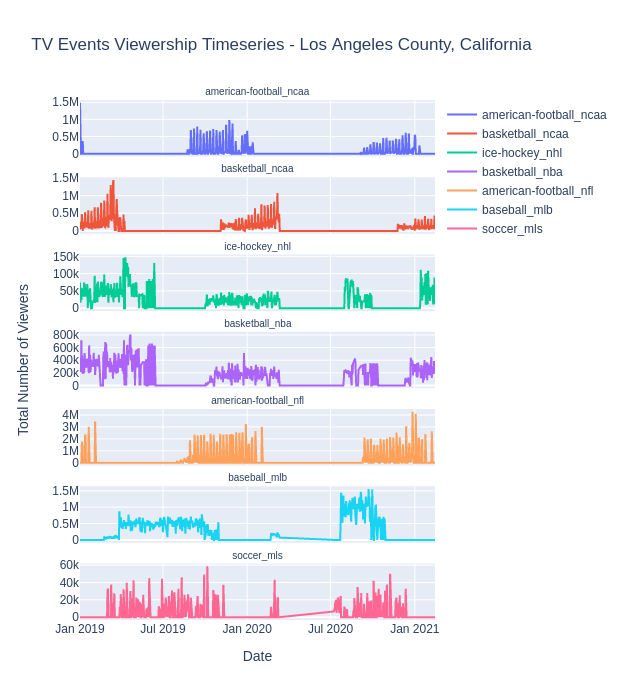

In [46]:
leagues = df['sport_league'].unique()

fig = make_subplots(rows=len(leagues),
                    cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.04,
                    subplot_titles=(leagues))

row = 1
for tv_feature in leagues:
    fig.add_trace(go.Scatter(x=df_tv['local_start_date'], y=df_tv[tv_feature],
                             mode='lines',
                             name=tv_feature), row=row, col=1)
    row = row + 1
fig.update_layout(height=len(leagues)*100)
fig.update_layout(
    title_text="TV Events Viewership Timeseries - {}".format(CURRENT_PLACENAME)
    )
for i in fig['layout']['annotations']:
    i['font'] = dict(size=10)
    
fig.update_yaxes(title_text="Total Number of Viewers", row=int(row/2))
fig.update_xaxes(title_text="Date", row = row-1 )


fig.show()


### Seasons
- As sports are played within seasons, in the off-season there will be no games and no viewership. 
- Viewship numbers increase throughout each season, peaking for the end of season games (eg Super Bowl)
- When forecasting consider the impact on test and train selections and these seasons. For example: If your test period has no NFL broadcasts you may not see the true benefit of NFL viewership data.


### Leagues

- Different leagues have different levels of popularity throughout the United States. 
- Viewership levels for MLS, NHL and MLB are lower than for the more popular NFL and NBA.
- A 50% increase in MSL viewership will have less of an impact on demand than a 50% increase in NFL because the total viewership popularity is lower.

<a id='one_team'></a>
## One Team

In this example we look just at games for the New Orleans Saints and the viewership in one county.

In [47]:
df_one_team = df[df['title'].str.contains('New Orleans Saints')].copy()

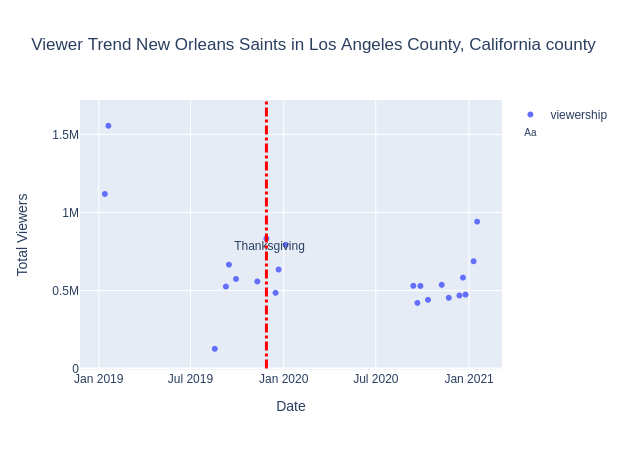

In [48]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_one_team['local_start_date'],
                         y=df_one_team['phq_viewership'],
                         mode='markers',
                         name='viewership'
))

fig.add_shape(type="line",
              x0='2019-11-28',
              y0=0,
              x1='2019-11-28',
              y1=df_one_team['phq_viewership'].max()*1.1,
              line=dict(color="Red", width=3, dash="dashdot")
              )
fig.add_trace(go.Scatter(
                         x=['2019-12-04'],
                         y=[df_one_team['phq_viewership'].max()*0.5],
                         text=["Thanksgiving"],
                         mode="text",
                         name=''
                         )
              )

fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Total Viewers")
fig.update_layout(
    title_text="Viewer Trend {} in {} county".format('New Orleans Saints', CURRENT_PLACENAME)
)

fig.show()

When looking at one team you can visualise the growing viewership of games as the season processes.

For certain teams you will also see the impact of special events. For example, games on Thanksgiving have higher viewership. 

<a id='spacial'></a>
## Visualize Live TV Events Viewership Spacially  - Super Bowl 

Access to county-level viewership data enables you to confidently forecast at a more granular level, such as for individual stores if you’re a quick-service restaurant or grocery store. 

- We provide viewership for 3142 counties in the US.
- If forecasting at a store level, and the store is at the boundary of a few counties, use the county that the store is in. While it might be true that demand can be caused from the neighbouring counties our testing has shown that using the county the store is in, is a good approximation.   
- If there are multiple stores in one county use the full county viewership. Although in this case you can't expect the total number of viewers to influence demand at each store, the relative viewership over time will still be appropriate. 
- If you are not modelling at the individual store level, you may need to consider how to normalise viewership at the county level. 

### Super Bowl Examples

To visualise event data spacially we will look at the 2018-19 and 2019-20 NFL Super Bowl.

In [49]:
def query_event_level_viewership(event_id):
    '''Query SDK for broadcast data for one broadcast event between
    start and end for all counties.
    '''
    search_results = phq.broadcasts.search(limit=500,
                                           phq_viewership__gte=100,
                                           event__event_id=event_id,
                                           ).iter_all()

    search_results = [result.to_dict() for result in search_results]

    df = pd.DataFrame(search_results)

    # Extract out additional information
    # 'event' stores the additional data about the physical event
    df = df.merge(df['event'].apply(pd.Series),
                  left_index=True,
                  right_index=True,
                  suffixes=('_broadcast', '_event'))

    # extract sport and league from the lables in the nested event data.
    df['sport'] = df.labels.apply(_extract_matching_label, args=(SPORTS,))
    df['league'] = df.labels.apply(_extract_matching_label, args=(LEAGUES,))

    df['local_start_date'] = (df.dates_broadcast
                                .apply(
                                        lambda start_dt:
                                        (start_dt['start_local']).date()
                                       )
                              )
    df['local_start_datetime'] = (df.dates_broadcast
                                    .apply(
                                           lambda start_dt:
                                           (start_dt['start_local'])
                                           )
                                  )
    df['county_place_id'] = (df.location_broadcast
                               .apply(
                                       lambda location:
                                       location['places'][0]['place_id']
                                     )
                             ).astype(int)
    return df

In [50]:
# Executes either the function to call the SDK or loads in the data from CSV.
if RUN_SETTING == 'SDK':
    superbowl_2019 = query_event_level_viewership(event_id='ePQLUqbPnMn3mQhe35')
    superbowl_2020 = query_event_level_viewership(event_id='svbfg9xT4YSVUeeAKp')
       
elif RUN_SETTING == 'CSV':
    superbowl_2019 = pd.read_csv('data/tv_events_data/superbowl_2019.csv')
    superbowl_2020 = pd.read_csv('data/tv_events_data/superbowl_2020.csv')
    
else:
    print("Must set RUN_SETTING to either 'SDK' or 'CSV'")

df['county_name'] = CURRENT_PLACENAME

In [51]:
'''Load in provided look up between geonames and FIPS
This look up is required to map placeid to FIPS which is
the ID used in the below chloropleth mapping.'''

GEO_NAMES = pd.read_csv('data/geo_data/geoname_to_fips_mapping.csv')
GEO_NAMES.head()

# Washington DC not contained within the lookup
washington = pd.DataFrame({'geoname_id': [4140963],
                           'county_name': 'Washington DC',
                            'county_fips': 11001})
GEO_NAMES = GEO_NAMES.append(washington)

In [52]:
def clean_one_broadcast_location_data(df): 
    ''' For visualisation using mapping the place_id
    is mapped to the FIPS id in the format required for the external geojson.
    '''
    # Choropleth map uses FIPS ids. Map between place_id and FIPS.
    df['county_place_id'] = df['county_place_id'].astype(int)
    df = df.merge(GEO_NAMES, how='left', left_on='county_place_id', right_on='geoname_id')

    # Convert to format to match chloropleth mapping.
    df['county_fips'] = df['county_fips'].astype(int)
    df['county_fips'] = df['county_fips'].astype(str)
    df['county_fips'] = df['county_fips'].str.zfill(5)
    df['county_fips'] = '0500000US' + df['county_fips']
    return df

In [53]:
def customise_geojson(df):
    ''' To visualise different features add the measure
    of interest to the properties in the geojson.
    '''
    f = open(file='data/geo_data/gz_2010_us_050_00_20m.json', mode='rb')
    contents = f.read()
    counties = json.loads(contents.decode("ISO-8859-1"))

    for entry in counties['features']:
        #print(entry['properties'])
        viewership = df[df['county_fips'] == entry['properties']['GEO_ID']]
        # Some locations will not have a viewership calculated.
        # This is usually because the event is not broadcast to 
        # enough of the population of the county.
        # For these counties we assign 0 viewership.
        if len(viewership) > 0:
            # Check the viewership has a real value.
            if math.isnan(viewership['phq_viewership'].values[0]):
                entry['properties']['phq_viewership'] = 0
            else:
                entry['properties']['phq_viewership'] = int(viewership['phq_viewership'].values[0])
        else:
            # Zero viewership for cases where it is not calculated.
             entry['properties']['phq_viewership'] = 0
                
    return counties

In [54]:
def visualize_one_broadcast(df, counties_geojson):
    ''' For one broadcast event output the viewership 
    across the United States.'''
    minimum = df["phq_viewership"].min()
    maximum = df["phq_viewership"].mean() + df["phq_viewership"].std() 

    linear = cmp.LinearColormap(
                                ['yellow',
                                 'green',
                                 'purple'],
                                vmin=minimum,
                                vmax=maximum,
                                caption='Viewership' 
                                )

    m = folium.Map(location=[41.4, -99.9], zoom_start=4)

    def style_function(x):
        return {
                "fillColor": linear(x["properties"]["phq_viewership"]),
                "color": "black",
                "weight": 2,
                "fillOpacity": 0.5,
                }
    countygeo = folium.GeoJson(
        counties_geojson,
        name="US Counties",
        style_function=style_function,
        tooltip=folium.GeoJsonTooltip(
                                      fields=['NAME',
                                              'phq_viewership'],
                                      aliases=['County',
                                               'Viewership'],
                                      localize=True
                                     ),
                                     ).add_to(m)

    linear.add_to(m)
    return m

### 2019-20 Super Bowl

In [55]:
superbowl_2020_clean = clean_one_broadcast_location_data(superbowl_2020)
counties_2020 = customise_geojson(superbowl_2020_clean)
visualize_one_broadcast(superbowl_2020_clean, counties_2020)

### Super Bowl Difference

In [56]:
# Examine the difference between the 2020 and 2019 superbowl. 
df_diff = superbowl_2020.merge(superbowl_2019,
                               how='left',
                               left_on='county_place_id',
                               right_on='county_place_id',
                               suffixes=('_2020', '_2019'))

# Calculate the growth in viewers at the county level. 
df_diff['viewer_growth'] = (df_diff['phq_viewership_2020'] -
                            df_diff['phq_viewership_2019']) / df_diff['phq_viewership_2019']


In [57]:
df_diff = clean_one_broadcast_location_data(df_diff)

In [58]:
f = open(file='data/geo_data/gz_2010_us_050_00_20m.json', mode='rb')
contents = f.read()
counties = json.loads(contents.decode("ISO-8859-1"))

for entry in counties['features']:
    #print(entry['properties'])
    viewership = df_diff[df_diff['county_fips'] == entry['properties']['GEO_ID']]
    if len(viewership) > 0:
        #print(viewership['viewer_growth'].values[0])   
        if math.isnan(viewership['viewer_growth'].values[0]):
            entry['properties']['viewer_growth'] = 0
        else:
            entry['properties']['viewer_growth'] = int(viewership['viewer_growth'].values[0] * 100)
        entry['properties']['18_19_viewership'] = str(viewership['phq_viewership_2019'].values[0])    
        entry['properties']['19_20_viewership'] = str(viewership['phq_viewership_2020'].values[0])  

    else:
         entry['properties']['viewer_growth'] = 0

minimum = (df_diff["viewer_growth"].mean() - 2 * df_diff["viewer_growth"].std()) * 100
maximum = (df_diff["viewer_growth"].mean() + 2 * df_diff["viewer_growth"].std()) * 100

linear = cmp.LinearColormap(
['yellow', 'green', 'purple'],
vmin=minimum, vmax=maximum,
caption='Color Scale for Map' #Caption for Color scale or Legend
)

m = folium.Map(location=[41.4, -99.9], zoom_start=4)

def style_function(x):
    return {
        "fillColor": linear(x["properties"]["viewer_growth"]),
        "color": "black",
        "weight": 2,
        "fillOpacity": 0.5,
    }


countygeo = folium.GeoJson(
    counties,
    name="US Counties",
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
                        fields=["NAME",
                                "viewer_growth",
                                '18_19_viewership',
                                '19_20_viewership'],
                        aliases=["County",
                                 "Viewer Growth (%)",
                                 '2018-19 Super Bowl Viewers',
                                 '2019-20 Super Bowl Viewers'], localize=True
                                ),
                            ).add_to(m)


linear.add_to(m)
folium.Marker(
    location=[42.0909, -71.2643],
    popup="New England Patriots Home Games (2019 Super Bowl)",
    icon=folium.Icon(color="blue", icon="info-sign"),
).add_to(m)

folium.Marker(
    location=[33.9534, -118.3387],
    popup="Los Angeles Rams  Home Games (2019 Super Bowl)",
    icon=folium.Icon(color="blue", icon="info-sign"),
).add_to(m)

folium.Marker(
    location=[39.0489, -94.4839],
    popup="Kanas City Chiefs Home Games (2020 Super Bowl)",
    icon=folium.Icon(color="red", icon="info-sign"),
).add_to(m)

folium.Marker(
    location=[37.4034, -121.9694],
    popup="San Francisco 49ers Home Games (2020 Super Bowl)",
    icon=folium.Icon(color="red", icon="info-sign"),
).add_to(m)

m


The map shows the relative % change in viewership between 2018-19 and 2019-20 across all counties. 

The markers show the home ground locations of the finalists for the 2020 and 2019 Super Bowl. 

 - 2019 Super Bowl - New England Patriots v Los Angeles Rams

 - 2020 Super Bowl - Kansas City Chiefs v San Fransico 49ers

By zooming into the map you can see that the viewership increased in the locations where the 2019-20 Super Bowl competitors play their home games and decreased for the teams that were in the Super Bowl in 2018-19. 

For some counties a viewership will not be predicted. These are areas where there is no predicted viewership because the broadcast is not shown to enough of the county population. The difference here is shown as 0 in the above visual.

There are other areas that have seen large % changes in the viewership numbers.

You'll note the changes around Miami and Atlanta. The 2019 Super Bowl was played in Atlanta and the 2020 Super Bowl played in Miami. 

It should be noted that for some counties, the viewership is very low and therefore changes can appear large in a % terms when the actual increase/decrease is small.

<a id='forecasting_impact'></a>
## Forecasting Impact

Within this notebook we've gained a better understanding of PredictHQ Live TV events data, what it represents and how it behaves. 

With this in mind we can take these findings and inform the decisions we make in forecasting. 

Here's a summary of some of the key take-ways from each section. 

- <b>Total Viewing Time</b><br>
Millions of viewing hours are spent watching sport every year. We can assign that by county, and by day and by time. Viewing varies over the year. 
- <b>Top 5 Games</b><br>
    End of season games, games with local teams and games in the NFL dominate the biggest viewership games. 
- <b>Broadcast Distribution</b><br>
    Different leagues have different number of games. 
- <b>Viewership Distribution</b><br>
    Viewership varies between leagues. The distribution is heavily skewed, with the biggest games being large outliers in comparison to the mean. 
- <b>Broadcast Duration</b><br>
  Viewer behaviour will be effected by the length of a game. Different leagues have different game lengths. 
- <b>Time of Viewing</b><br>
  Viewing can be broken down into time of day. Different periods of the day have differing number of games and viewers.
- <b>TV events data as Timeseries</b><br>
  Timeseries shows the effect of leagues, and seasons. 
- <b>TV events Spacially - Super Bowl</b><br>
  Viewership varies across the country and viewership of top games such as the Super Bowl is affected by which teams are competing. 
- <b>One Team</b><br>
  As the season progresses more people watch a teams games. Games on days like Thanksgiving see increased viewership.